In [2]:
#Importing modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
from pymsaviz import MsaViz
from Bio.Seq import Seq
from Bio.SeqRecord import SeqRecord


In [3]:
#Importing input data
data = pd.read_excel('GUIDE-seq.xlsx')



In [4]:
data.head()

,chrom,chromStart,chromEnd,name,GUIDEseq_reads,strand,offtarget_sequence,genomic_coordinate,distance,target,run
0,chr19,55115744,55115767,AAVS1_site_1,13557,+,GTCACCAATCCTGTCCCTAGTGG,chr19:55115745-55115767:+,0,GTCACCAATCCTGTCCCTAGNGG,1
1,chrX,1450701,1450724,AAVS1_site_1,190,+,CTCCCCAACCCCATCCCTAGGGG,chrX:1450702-1450724:+,5,GTCACCAATCCTGTCCCTAGNGG,1
2,chrX,1452125,1452148,AAVS1_site_1,105,+,CTCCCCAACCCCATCCCTAGGGG,chrX:1452126-1452148:+,5,GTCACCAATCCTGTCCCTAGNGG,1
3,chr1,12523844,12523867,AAVS1_site_1,2,+,CACACTAATCCTGTCCCCAGAGG,chr1:12523845-12523867:+,4,GTCACCAATCCTGTCCCTAGNGG,1
4,chr19,55115744,55115767,AAVS1_site_1,55079,+,GTCACCAATCCTGTCCCTAGTGG,chr19:55115745-55115767:+,0,GTCACCAATCCTGTCCCTAGNGG,2


In [5]:
data.describe()

,chromStart,chromEnd,GUIDEseq_reads,distance,run
count,1.702000e+03,1.702000e+03,1702.000000,1702.000000,1702.000000
mean,7.467903e+07,7.467905e+07,1152.605170,3.809048,2.052879
std,5.686153e+07,5.686153e+07,5197.010365,1.297341,0.888638
min,4.488000e+03,4.511000e+03,2.000000,0.000000,1.000000
25%,2.994975e+07,2.994977e+07,11.000000,3.000000,2.000000
50%,6.125732e+07,6.125734e+07,38.000000,4.000000,2.000000
75%,1.139523e+08,1.139523e+08,189.750000,5.000000,2.000000
max,2.466852e+08,2.466852e+08,81965.000000,6.000000,4.000000


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1702 entries, 0 to 1701
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   chrom               1702 non-null   object
 1   chromStart          1702 non-null   int64 
 2   chromEnd            1702 non-null   int64 
 3   name                1702 non-null   object
 4   GUIDEseq_reads      1702 non-null   int64 
 5   strand              1702 non-null   object
 6   offtarget_sequence  1702 non-null   object
 7   genomic_coordinate  1702 non-null   object
 8   distance            1702 non-null   int64 
 9   target              1702 non-null   object
 10  run                 1702 non-null   int64 
dtypes: int64(5), object(6)
memory usage: 146.4+ KB


In [7]:
#Getting Chromosome Lengths From reference genome
from Bio import SeqIO 
ref = r'D:\bioinfo\refs\hg19\hg19.fasta'
chroms = SeqIO.parse(open(ref),'fasta')
c=0
chromLengths=[]
for chrom in chroms:
    
    print(chrom.description.split(':')[-2])
    chromLengths+=[int(chrom.description.split(':')[-2])]
    c+=1
    if c==23:
        break
genome=SeqIO.parse(open(ref),'fasta')

249250621
243199373
198022430
191154276
180915260
171115067
159138663
146364022
141213431
135534747
135006516
133851895
115169878
107349540
102531392
90354753
81195210
78077248
59128983
63025520
48129895
51304566
155270560


PDCD1_site_8  :  544
target sequence:['GAGCAGGGCTGGGGAGAAGGNGG']
reads median:33.0
reads mean:174.9246323529412

TRAC_site_4  :  126
target sequence:['GACACCTTCTTCCCCAGCCCNGG']
reads median:30.0
reads mean:520.6904761904761

CXCR4_site_3  :  122
target sequence:['GAAGATGATGGAGTAGATGGNGG']
reads median:37.0
reads mean:1182.4590163934427

LAG3_site_9  :  120
target sequence:['GAAGGCTGAGATCCTGGAGGNGG']
reads median:76.5
reads mean:2201.425

TRAC_site_2  :  100
target sequence:['GCTGGTACACGGCAGGGTCANGG']
reads median:27.5
reads mean:414.56

AAVS1_site_4  :  81
target sequence:['GCTCGGGGACACAGGATCCCNGG']
reads median:51.0
reads mean:864.9506172839506

PDCD1_site_7  :  76
target sequence:['GGGGGGTTCCAGGGCCTGTCNGG']
reads median:73.0
reads mean:521.4473684210526

PDCD1_site_10  :  61
target sequence:['GGAGAAGGTGGGGGGGTTCCNGG']
reads median:14.0
reads mean:43.278688524590166

AAVS1_site_13  :  53
target sequence:['GTCCCCTCCACCCCACAGTGNGG']
reads median:23.0
reads mean:254.43396226415095

CCR5_

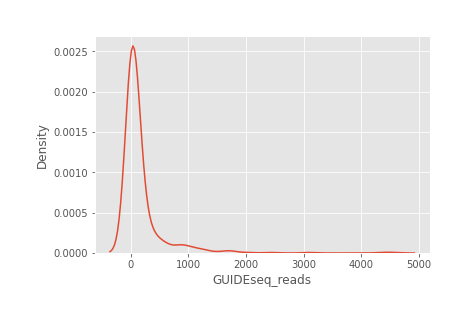

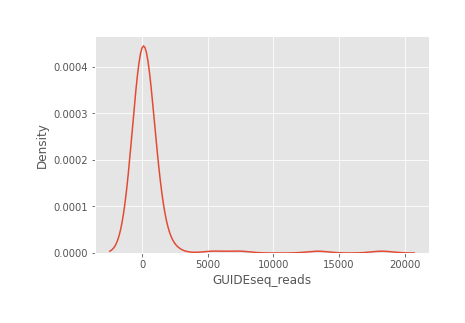

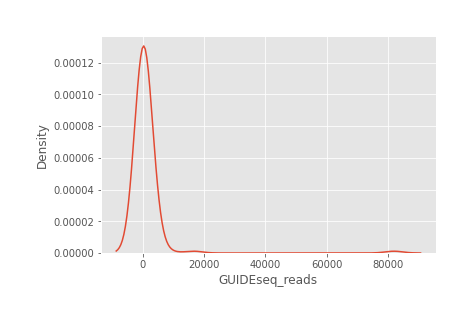

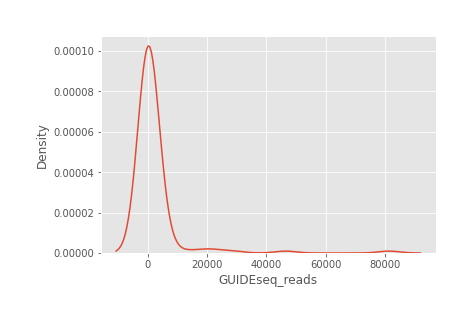

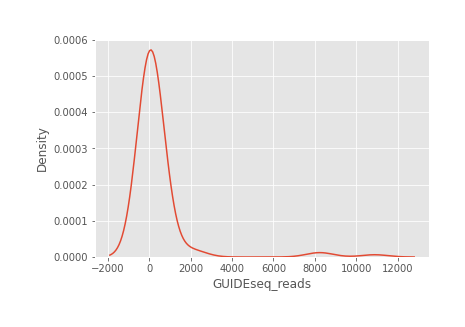

...

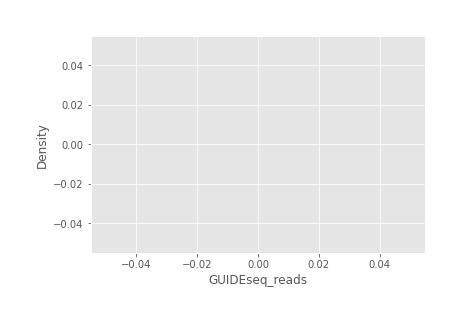

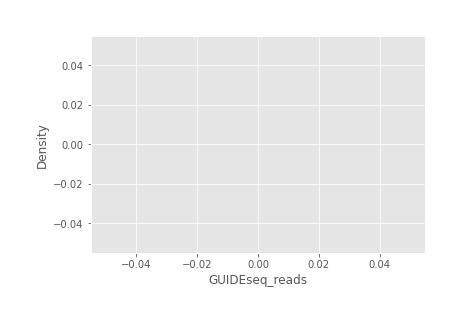

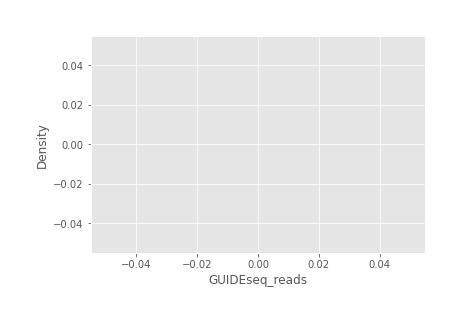

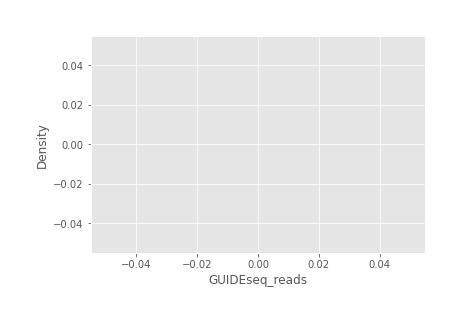

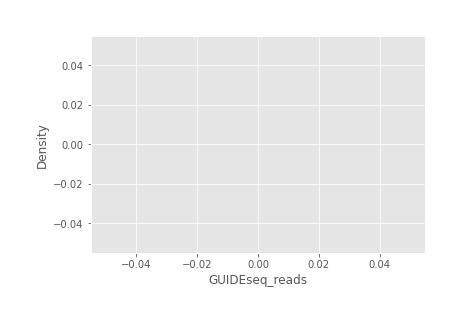

In [104]:
# Creating a dataframe for each individual target (gRNA)
names = data['name'].unique()
dfs = {}
for name in names:
    dfs[name] = data.loc[data['name']==name]

# Sorting dataframes based on number of Off-targets found 
dfs_sorted = dict(sorted(dfs.items(),key =lambda x:len(x[1]),reverse=True))
#Printing target name, number of OTS
#Printing On target sequence 
tname_tcoordinate={} #target name: target genomic coordinate
high_freq={}
low_freq={}
for name,df in dfs_sorted.items():
    print(name," : ",len(dfs[name]))
    print(f"target sequence:{dfs[name]['target'].unique()}")
    tname_tcoordinate[name]=df[df['distance']==0]['genomic_coordinate'].unique()[0]

    median=df['GUIDEseq_reads'].median()
    mean=df['GUIDEseq_reads'].mean()
    print(f"reads median:{median}")
    print(f"reads mean:{mean}")

    print()

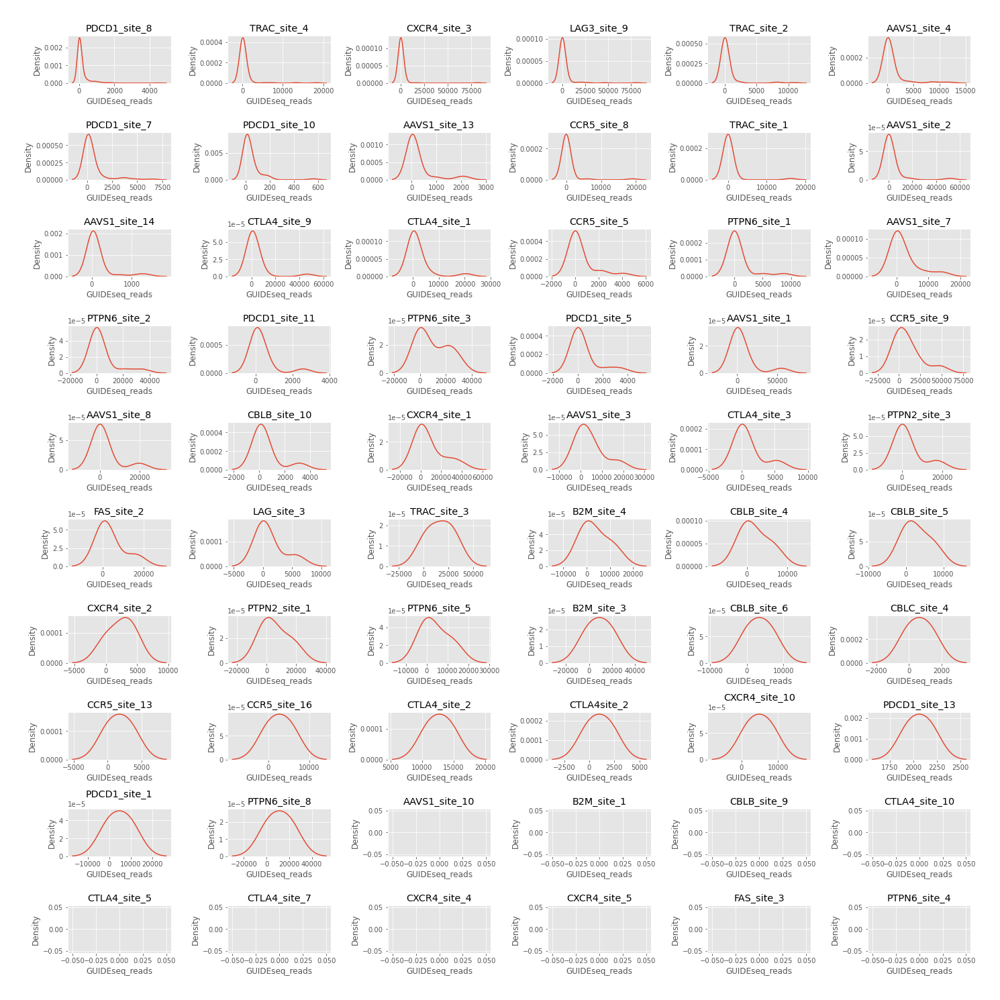

In [105]:
plt.style.use('ggplot')
#plt.style.use('seaborn')

fig,axs=plt.subplots(10,6,figsize=(20,20))
axs=axs.ravel()
i=0
for df in dfs_sorted.values():
    #print(df)
    name =df['name'].unique()[0]
    #print(name)
    axs[i].set_title(name)
    sns.kdeplot(x='GUIDEseq_reads',data=df,ax=axs[i])
    
    i+=1
    
fig.tight_layout()
#fig.savefig(fr"plots\readcounts_distance.png", format='png', dpi=1200)

plt.show()


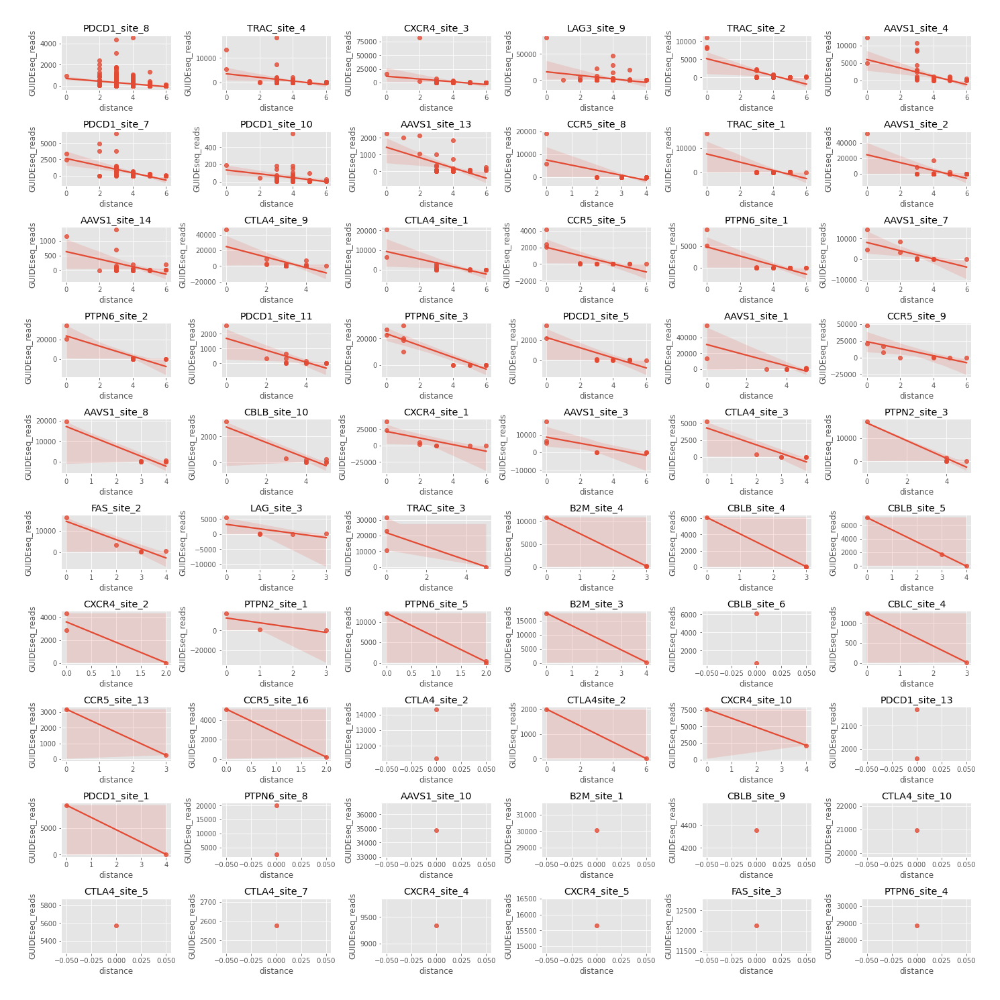

In [101]:

plt.style.use('ggplot')
#plt.style.use('seaborn')

fig,axs=plt.subplots(10,6,figsize=(20,20))
axs=axs.ravel()
i=0
for df in dfs_sorted.values():
    #print(df)
    name =df['name'].unique()[0]
    #print(name)
    axs[i].set_title(name)
    sns.regplot(y='GUIDEseq_reads',x='distance',data=df,ax=axs[i])
    
    i+=1
    
fig.tight_layout()
#fig.savefig(fr"plots\readcounts_distance.png", format='png', dpi=1200)

plt.show()


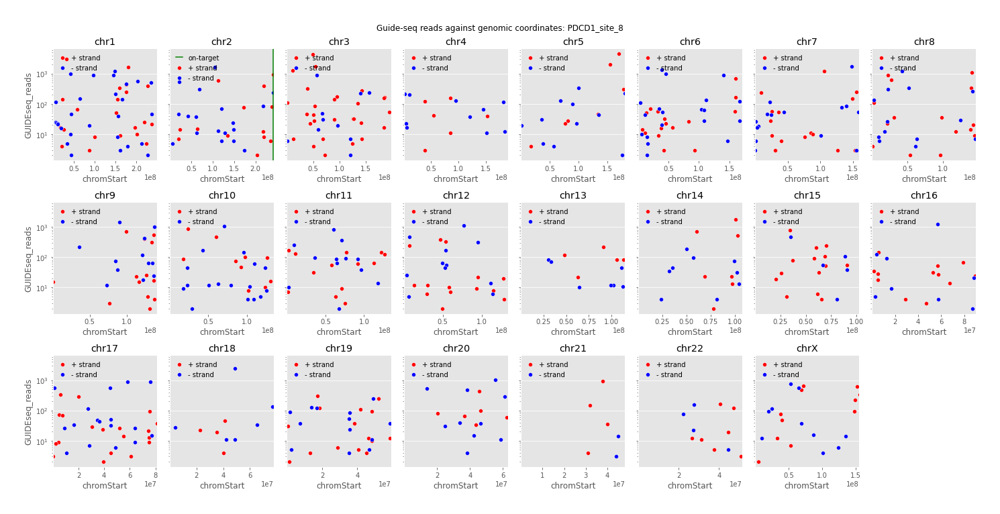

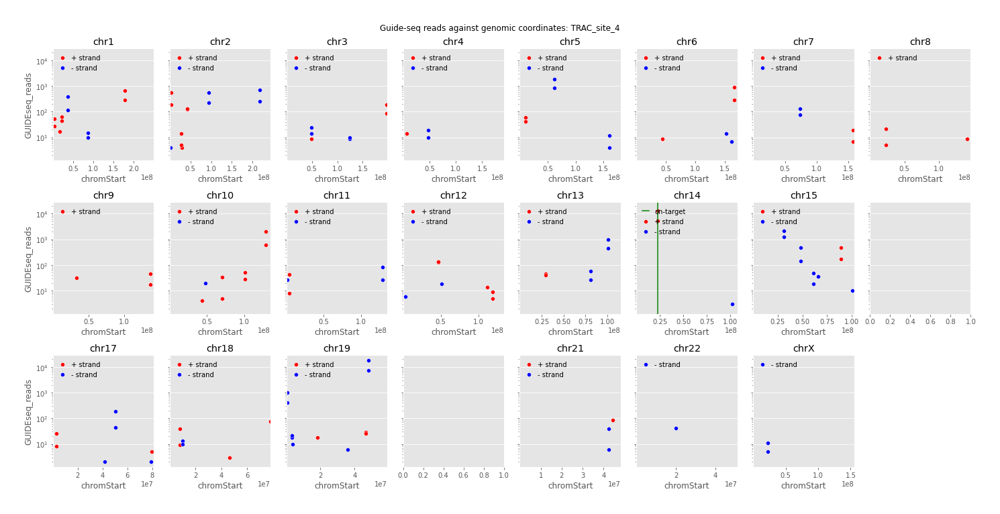

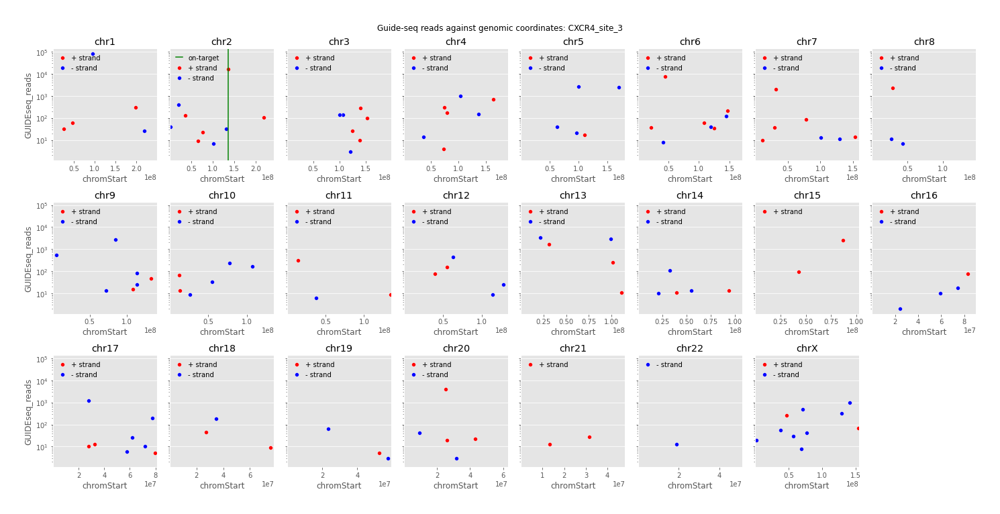

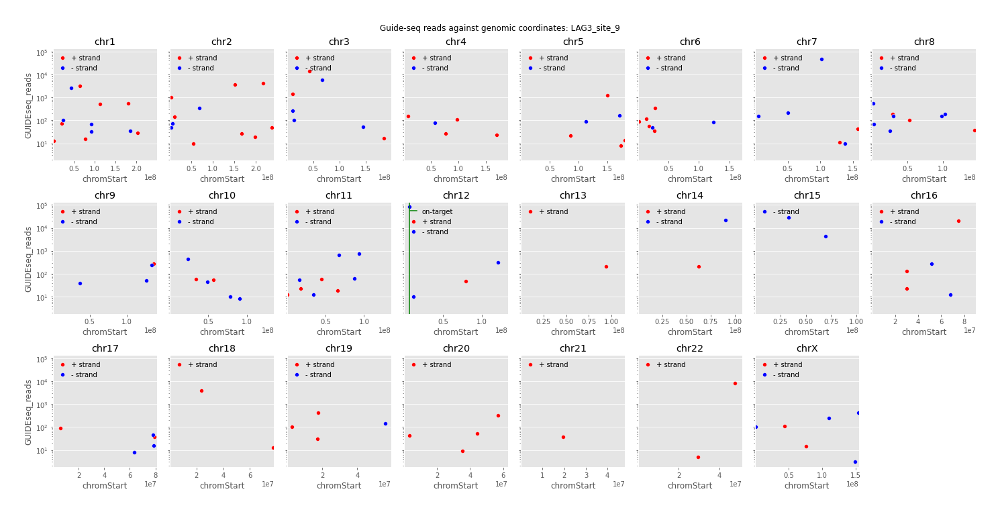

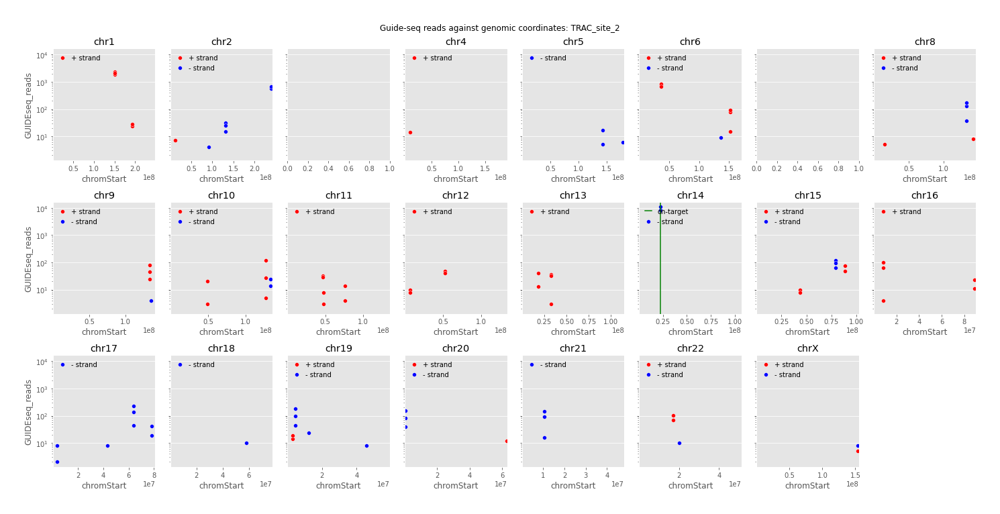

...

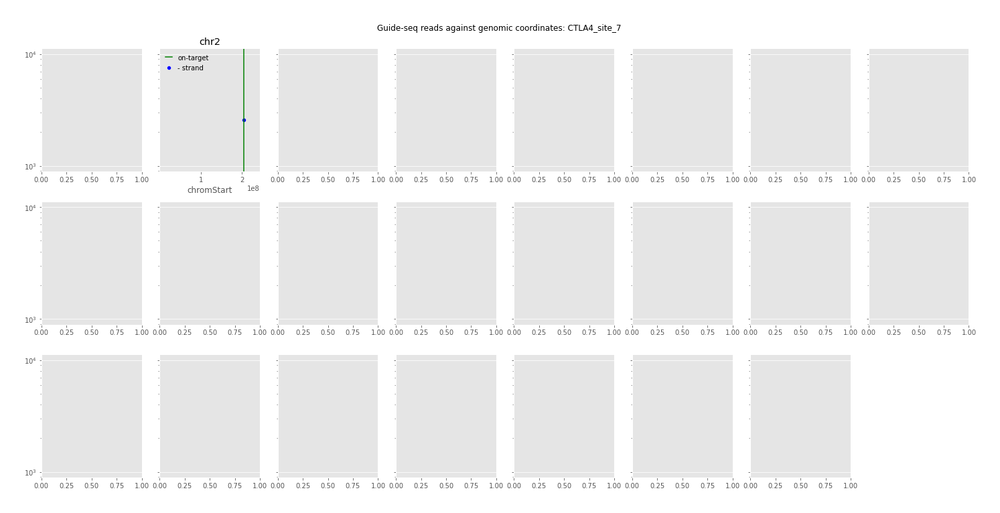

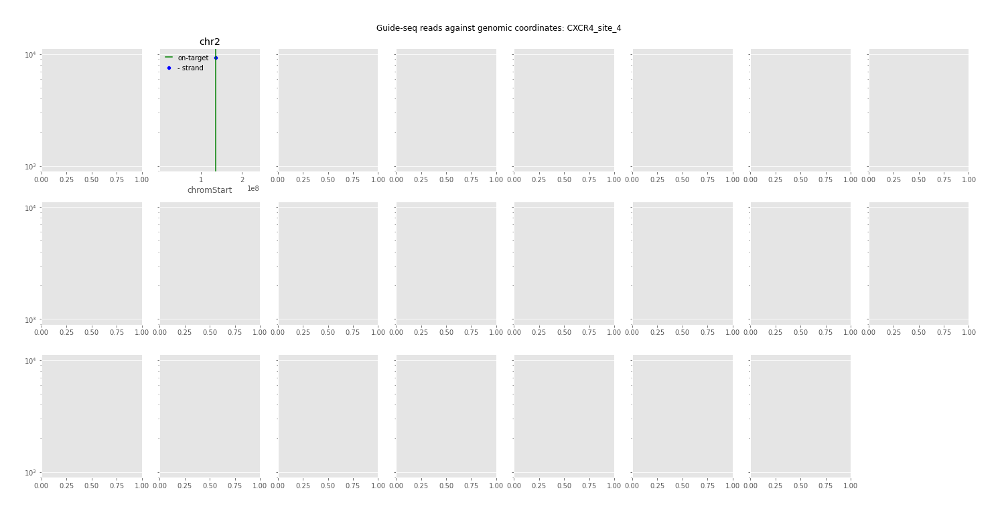

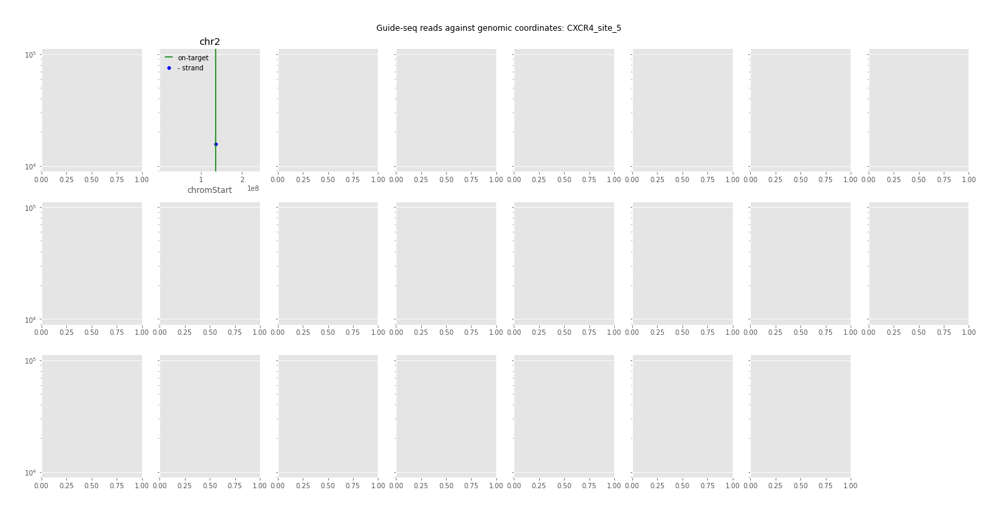

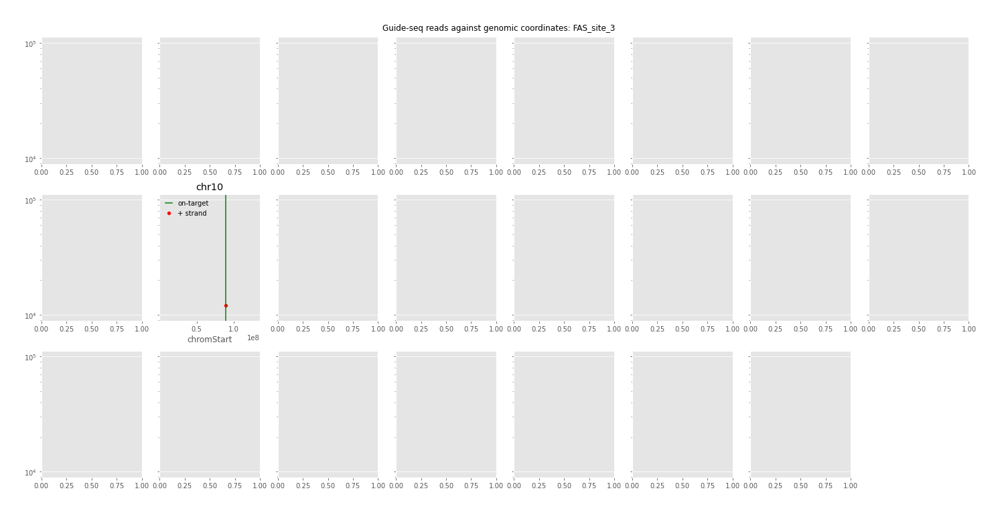

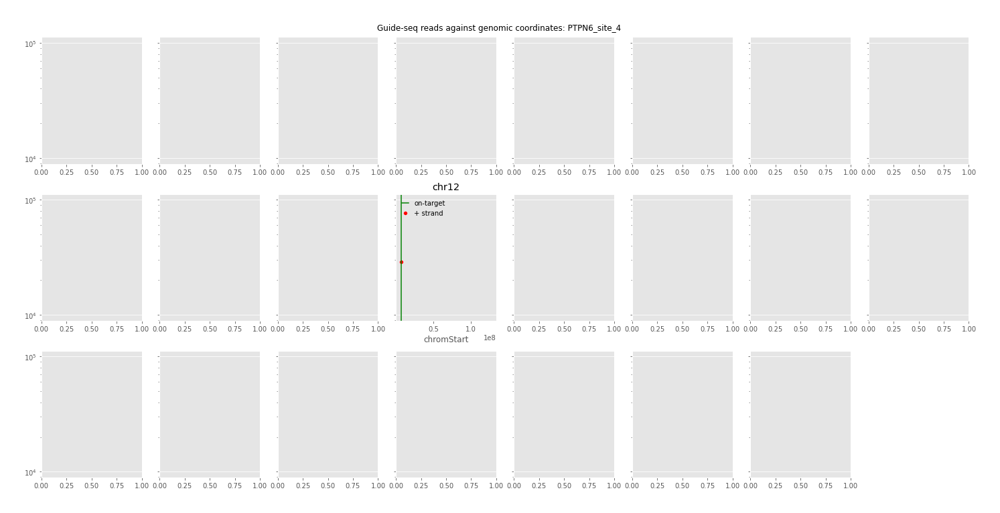

In [107]:

plt.style.use('ggplot')
for df in dfs_sorted.values():
    #print(df)
    
    name =df['name'].unique()[0]
    #print(name)
    chroms=df.groupby('chrom')
    fig,axs=plt.subplots(3,8,figsize=(20,10),sharey=True)
    axs=axs.ravel()
    
    tchromStart= int(tname_tcoordinate[name].split(':')[1].split('-')[0])
    tchrom= tname_tcoordinate[name].split(':')[0]
    
    for i in range(23):
        if i==22:
            chrom='chr'+'X'
        else:
            chrom= 'chr'+str(i+1)
        if chrom not in chroms.indices:
            axs[i].xaxis.grid(False)
            continue
        else:
            #print(chrom[0])
            axs[i].xaxis.grid(False)

            #axs[i].set_xlabel('chromStart')
            axs[i].set_title(chrom)
            if chrom==tchrom:
                #rint('y')
                #print(f'ontarget:{tchromStart}')
                #print()
                #print(dfs['PDCD1_site_8']['chromStart'])
                axs[i].axvline(tchromStart,color='green',linestyle='-',label='on-target')
                    
            df=chroms.get_group(chrom)
            pos_df=df[df['strand']=='+']
            neg_df=df[df['strand']=='-']
            axs[i].set_xlim(1,chromLengths[i])
            axs[i].set(yscale='log')
            sns.scatterplot(x='chromStart',y='GUIDEseq_reads',data=pos_df,label='+ strand',ax=axs[i],
                            color='red')
            sns.scatterplot(x='chromStart',y='GUIDEseq_reads',data=neg_df,label='- strand',ax=axs[i],
                            color='blue')
            
    
    
    fig.delaxes(axs[23])
    fig.suptitle(f'Guide-seq reads against genomic coordinates: {name}')

    fig.tight_layout()
    fig.savefig(fr"plots\{name}.png", format='png', dpi=300)

    plt.show()


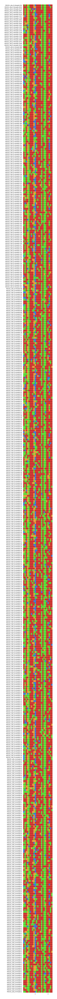

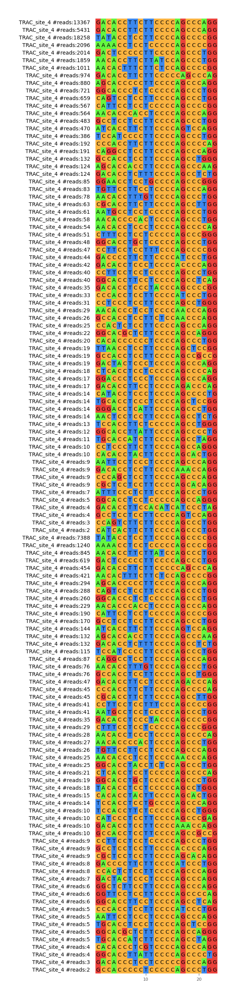

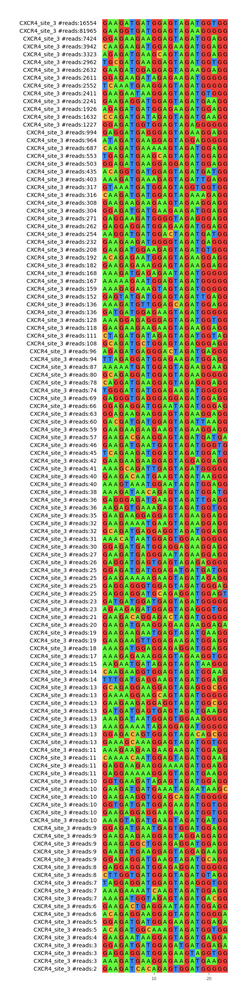

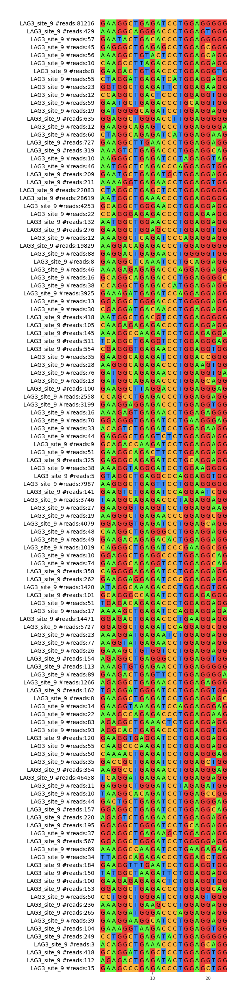

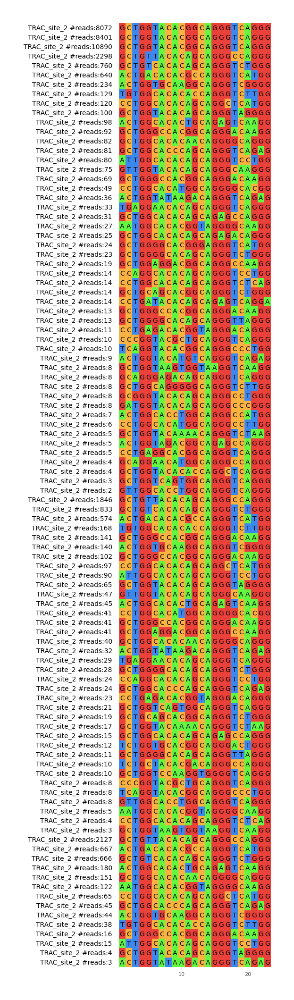

...

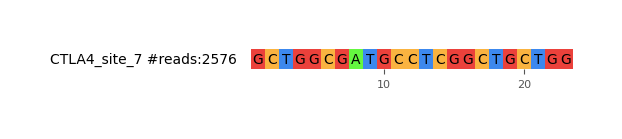

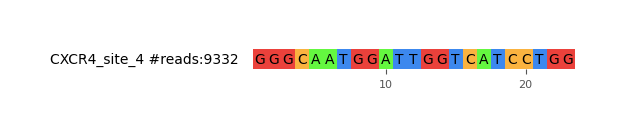

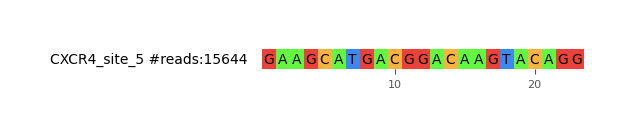

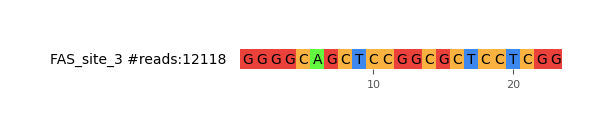

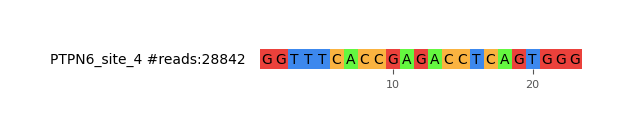

In [101]:
for df in dfs_sorted.values():
    #Moving Target Sequence to the top: (?Weird that an off-target could have more read counts?!)
    target_row = df[df['distance']==0]
    df = pd.concat([target_row, df.drop(target_row.index)], axis=0).reset_index(drop=True)

    name =df['name'].unique()[0]
    records = (SeqRecord(Seq(row['offtarget_sequence']),id= row['name'],description="#reads:"+str(row['GUIDEseq_reads'])) for index,row in df.iterrows() )
    
    with open(fr"OT-msa\{name}.fasta",'w') as f:
        SeqIO.write(records,handle=f,format= "fasta")   
    
    with open(fr'OT-msa\{name}.fasta') as f:
        mv = MsaViz(f, wrap_length=25, show_count=False,label_type='description',show_label=True,color_scheme='Nucleotide')
        mv.savefig(f"{name}.png")            

